In [1]:
from fbprophet import Prophet
import pandas as pd
import datetime as dt
from fbprophet.plot import plot_plotly
from sklearn.preprocessing import LabelEncoder
from scipy.io import arff
import plotly.offline as py
py.init_notebook_mode()
import altair as alt
alt.renderers.enable('notebook')
%matplotlib inline

In [42]:
# Property sales data for the 2007-2019 period for one specific region. 
# The data contains sales prices for houses and units with 1,2,3,4,5 bedrooms. 
data = pd.read_csv('raw_sales.csv')

In [43]:
data.head()

,datesold,postcode,price,propertyType,bedrooms
0,2007-02-07 00:00:00,2607,525000,house,4
1,2007-02-27 00:00:00,2906,290000,house,3
2,2007-03-07 00:00:00,2905,328000,house,3
3,2007-03-09 00:00:00,2905,380000,house,4
4,2007-03-21 00:00:00,2906,310000,house,3


In [44]:
label_encoder = LabelEncoder()
data.iloc[:,3] = label_encoder.fit_transform(data.iloc[:,3])

In [45]:
X = data[['datesold','postcode','propertyType','bedrooms']]
y = data.iloc[:,2]

In [46]:
train_dataset = pd.DataFrame()
train_dataset['ds'] = pd.to_datetime(X['datesold'])
train_dataset['postcode'] = X['postcode']
train_dataset['propertyType'] = X['propertyType']
train_dataset['bedrooms'] = X['bedrooms']
train_dataset['y']  = y
train_dataset.head(5)

,ds,postcode,propertyType,bedrooms,y
0,2007-02-07,2607,0,4,525000
1,2007-02-27,2906,0,3,290000
2,2007-03-07,2905,0,3,328000
3,2007-03-09,2905,0,4,380000
4,2007-03-21,2906,0,3,310000


In [26]:
def fit_predict_model(dataframe, interval_width = 0.99, changepoint_range = 0.8):
    model = Prophet()
    model.add_regressor('propertyType')
    model.add_regressor('postcode')
    model.add_regressor('bedrooms')
    model = model.fit(dataframe)
    forecast = model.predict(dataframe)
    forecast['fact'] = dataframe['y'].reset_index(drop = True)
    return forecast, model

In [27]:
def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()
    
    #Checks for places where forcasted data is not in the bounds
    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    #anomaly importances
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecast['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecast['fact']
    return forecasted

In [47]:
pred, m = fit_predict_model(train_dataset)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


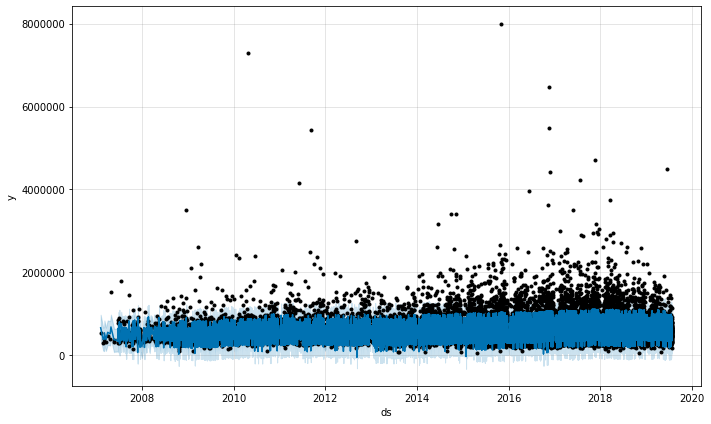

In [48]:
pred = detect_anomalies(pred)
fig = m.plot(pred)

In [52]:
def plot_anomalies(forecasted):
    interval = alt.Chart(forecasted).mark_area(interpolate="basis", color = '#7FC97F').encode(
    x=alt.X('ds:T',  title ='date'),
    y='yhat_upper',
    y2='yhat_lower',
    tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive().properties(
        title='Anomaly Detection'
    )

    fact = alt.Chart(forecasted[forecasted.anomaly==0]).mark_circle(size=15, opacity=0.7, color = 'Black').encode(
        x='ds:T',
        y=alt.Y('fact', title='price'),    
        tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive()

    anomalies = alt.Chart(forecasted[forecasted.anomaly!=0]).mark_circle(size=30, color = 'Red').encode(
        x='ds:T',
        y=alt.Y('fact', title='temp'),    
        tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper'],
        size = alt.Size( 'importance', legend=None)
    ).interactive()

    return alt.layer(interval, fact, anomalies)\
              .properties(width=870, height=450)\
              .configure_title(fontSize=20)

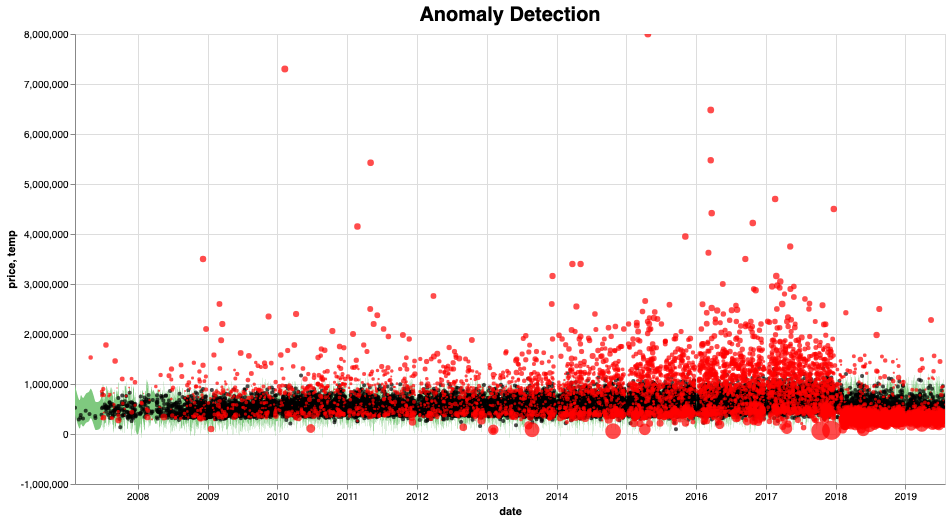

In [53]:
alt.data_transformers.disable_max_rows()

plot_anomalies(pred)

In [54]:
pred.head()

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
0,2007-02-07,523770.529835,659108.620280,387799.167064,974974.057297,525000,0,0.0
1,2007-02-27,523150.094752,383043.070295,107936.693192,660673.466645,290000,0,0.0
2,2007-03-07,522901.920718,378000.170324,94640.092425,677476.921805,328000,0,0.0
3,2007-03-09,522839.877210,538387.668444,254117.765546,836252.775217,380000,0,0.0
4,2007-03-21,522467.616160,379793.645623,99953.129854,662135.642387,310000,0,0.0
